# 1. Загрузить при помощи kaggle api в Google collab

kaggle datasets download -d nexuswho/laboro-tomato -p /content --unzip



In [139]:
import math
from itertools import accumulate

import cv2
import numpy as np

import cv2
from IPython.display import display
from PIL import Image

def show_image(img, max_size=312):
    h, w = img.shape[:2]
    scale = min(max_size / w, max_size / h)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(img, (new_w, new_h))
    if len(resized.shape) == 3:
        img_rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
        display(Image.fromarray(img_rgb))
    else:
        display(Image.fromarray(resized))


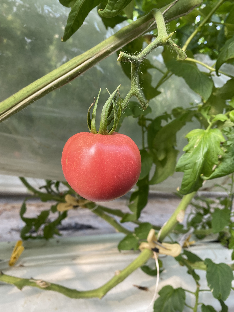

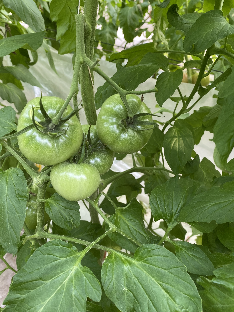

In [189]:
originalImage = cv2.imread('images/IMG_0990.jpg')
originalImage1 = cv2.imread('images/IMG_0998.jpg')

show_image(originalImage)
show_image(originalImage1)


## Перевод в чб


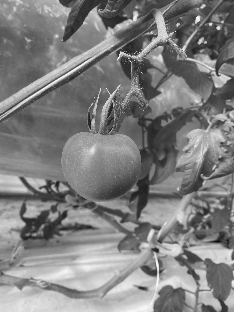

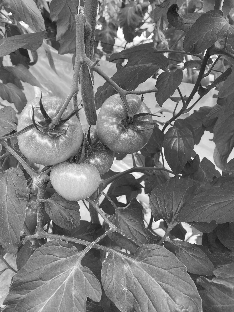

In [190]:
gray_image = cv2.cvtColor(originalImage, cv2.COLOR_BGR2GRAY)
gray_image1 = cv2.cvtColor(originalImage1, cv2.COLOR_BGR2GRAY)

show_image(gray_image)
show_image(gray_image1)



## Фиксированное изменение размера

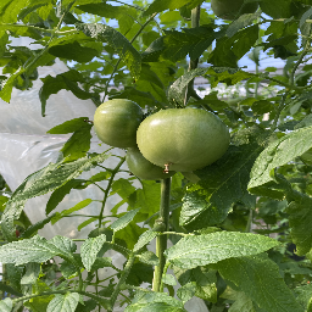

In [142]:
import cv2
img = cv2.imread('images/IMG_0984.jpg')
fixed_resized = cv2.resize(img, (256, 256))

show_image(fixed_resized)


## Пропорциональное изменение размера

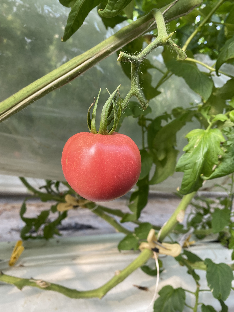

In [143]:
import cv2

h, w = originalImage.shape[:2]

max_size = 312

scale = min(max_size / w, max_size / h)
new_w, new_h = int(w * scale), int(h * scale)

resized = cv2.resize(originalImage, (new_w, new_h))
show_image(resized)

 ## Изменить порядок каналов

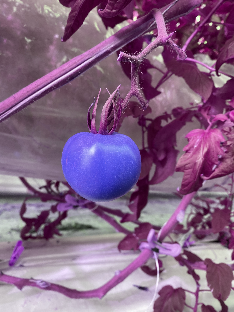

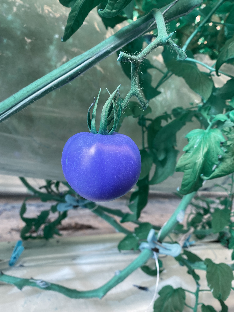

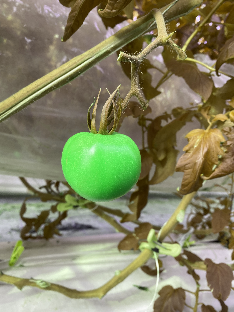

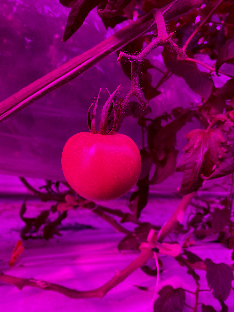

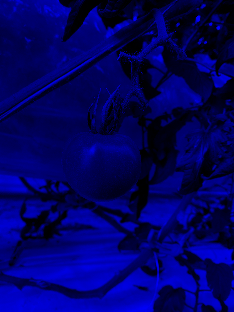

In [144]:
# изначально originalImage в [B, G, R]
# 2 (сдана) (сделана) - R, 0 - B, 1 - G

# (R, B, G)
img_rbg = originalImage.copy()
img_rbg = img_rbg[:, :, [2, 0, 1]].copy()

#  (R, G, B)
img_rgb = originalImage.copy()
img_rgb = img_rgb[:, :, [2, 1, 0]].copy()

# (B, R, G)
img_brg = originalImage.copy()
img_brg = img_brg[:, :, [0, 2, 1]].copy()

# (B, R, B)
img_brb = originalImage.copy()
img_brb[:, :, 1] = 0

# (B, B, B)
img_bbb = originalImage.copy()
img_bbb[:, :, 1] = 0
img_bbb[:, :, 2] = 0

show_image(img_rbg)
show_image(img_rgb)
show_image(img_brg)
show_image(img_brb)
show_image(img_bbb)

## Поворот

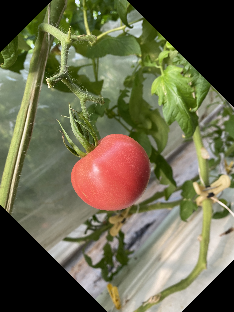

In [145]:
(h, w) = originalImage.shape[:2]
center = (w // 2, h // 2)

angle = 45 # против часовой
scale = 1.0

# матрица поворота
M = cv2.getRotationMatrix2D(center, angle, scale) # Аффинное преобразование

rotated = cv2.warpAffine(originalImage, M, (w, h))

show_image(rotated)

## Переместить центр изображения

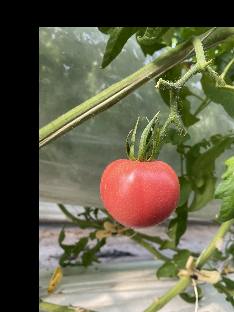

In [146]:


h, w = originalImage.shape[:2]

tx, ty = 500, 350  # вправо 100, вниз 50

# матрица трансляции
M = np.float32([[1, 0, tx],
                [0, 1, ty]])

shifted = cv2.warpAffine(originalImage, M, (w, h))

show_image(shifted)


## Рамка

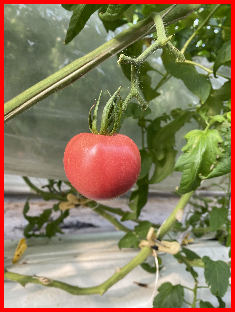

In [147]:
bordered = cv2.copyMakeBorder(
    originalImage,
    top=50, bottom=50, left=50, right=50,
    borderType=cv2.BORDER_CONSTANT,
    value=(0, 0, 255)
)

show_image(bordered)


## Отражения

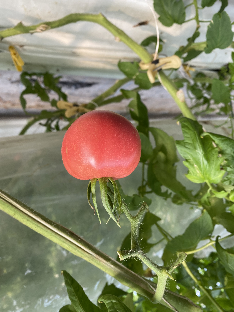

In [148]:
flipped = cv2.flip(originalImage, 0) # -1 0 1
show_image(flipped)

## Обрезание

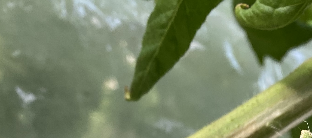

In [149]:
x1 = 250
x2 = 1600

y1 = 100
y2 = 700
crop = originalImage[y1:y2, x1:x2]
show_image(crop)

# 3. Фильтр соболя

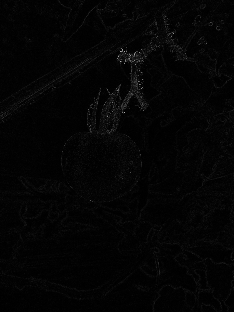

In [150]:
gray_image = cv2.cvtColor(originalImage, cv2.COLOR_BGR2GRAY)

kx  = np.array([[-1, 0, 1],
               [-2, 0, 2],
               [-1, 0, 1]], dtype=np.float32)
ky  = np.array([[-1, -2, -1],
               [0, 0, 0],
               [1, 2, 1]], dtype=np.float32)

test_img = np.array([ [10, 20, 30, 40, 50, 60],
                      [20, 30, 40, 50, 60, 70],
                      [30, 40, 50, 60, 70, 80],
                      [40, 50, 60, 70, 80, 90],
                      [50, 60, 70, 80, 90,100],
                      [60, 70, 80, 90,100,110] ], dtype=np.float32)


# свёртка
Gx = cv2.filter2D(gray_image, ddepth=cv2.CV_32F, kernel=kx, borderType=cv2.BORDER_CONSTANT)
Gy = cv2.filter2D(gray_image, ddepth=cv2.CV_32F, kernel=ky, borderType=cv2.BORDER_CONSTANT)



G = (Gx ** 2  +Gy ** 2) ** 0.5

G_my_Sobol_norm = (G / G.max()) * 255
G_my_Sobol_uint8 = G_my_Sobol_norm.astype(np.uint8)

show_image(G_my_Sobol_uint8)


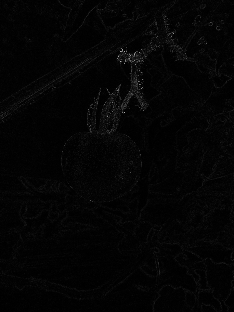

In [151]:
import cv2
import numpy as np


Gx_sobel = cv2.Sobel(gray_image, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=3)
Gy_sobel = cv2.Sobel(gray_image, ddepth=cv2.CV_32F, dx=0, dy=1, ksize=3)

G_sobel = np.sqrt(Gx_sobel**2 + Gy_sobel**2)

G_sobel_norm = 255 * (G_sobel / G_sobel.max())
G_sobel_uint8 = G_sobel_norm.astype(np.uint8)

show_image(G_sobel_uint8)


# 1. Реализовать алгоритм Хаффа для поиска линий + 1

In [152]:
from IPython.display import HTML
HTML('''
<style>
img[src^="attachment:"], img[src*="attachment:"] {
  display: block;
  margin-left: auto;
  margin-right: auto;
  max-width: 400px !important;
  height: auto !important;
  margin-top: 20px;
  margin-bottom: 20px;
}
</style>
''')


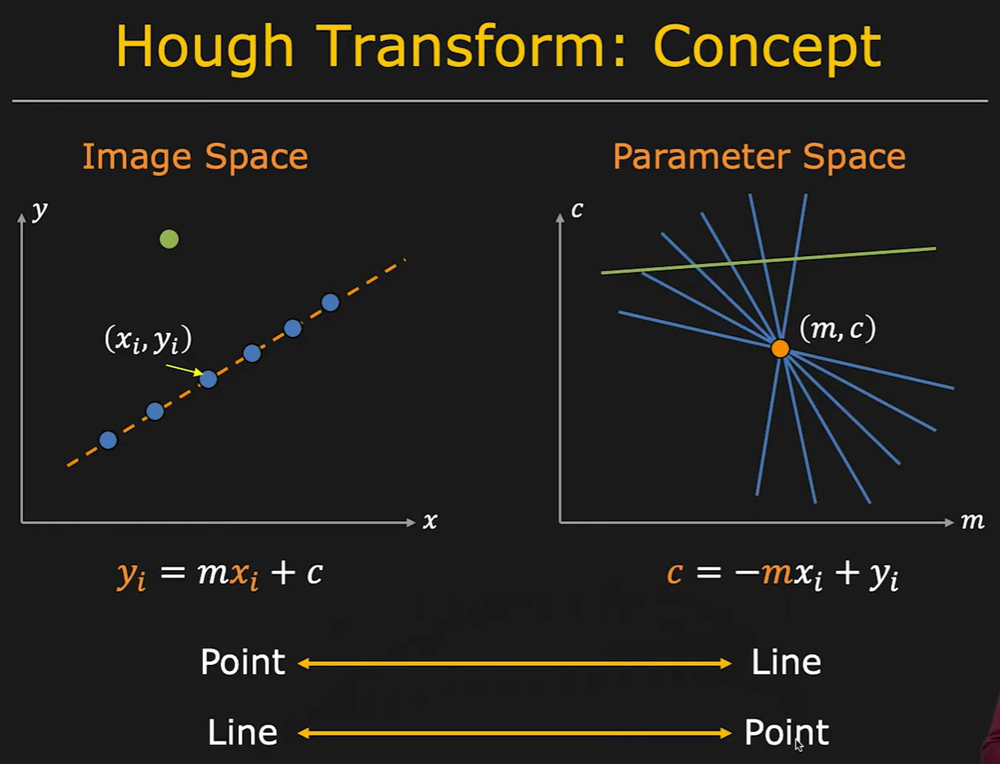

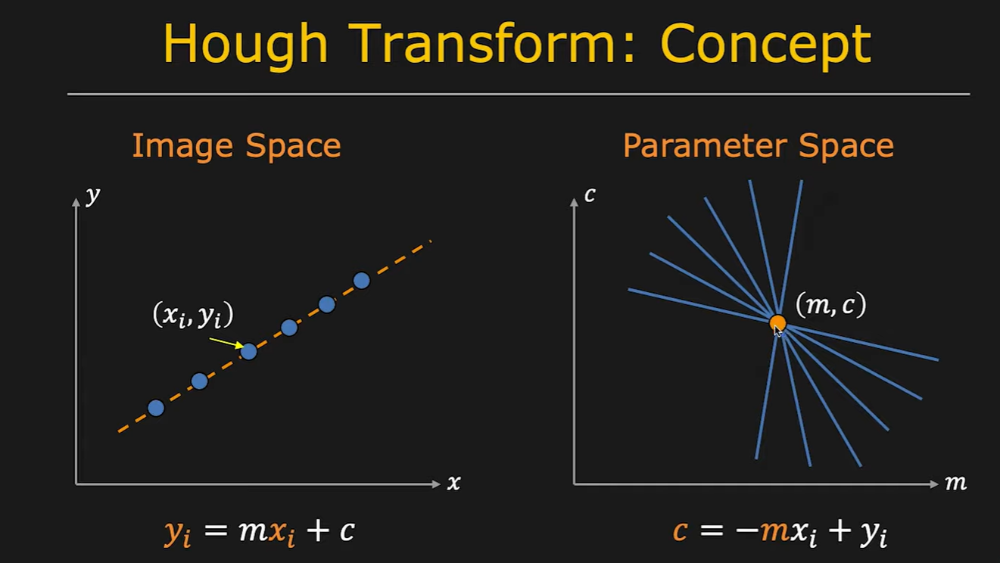
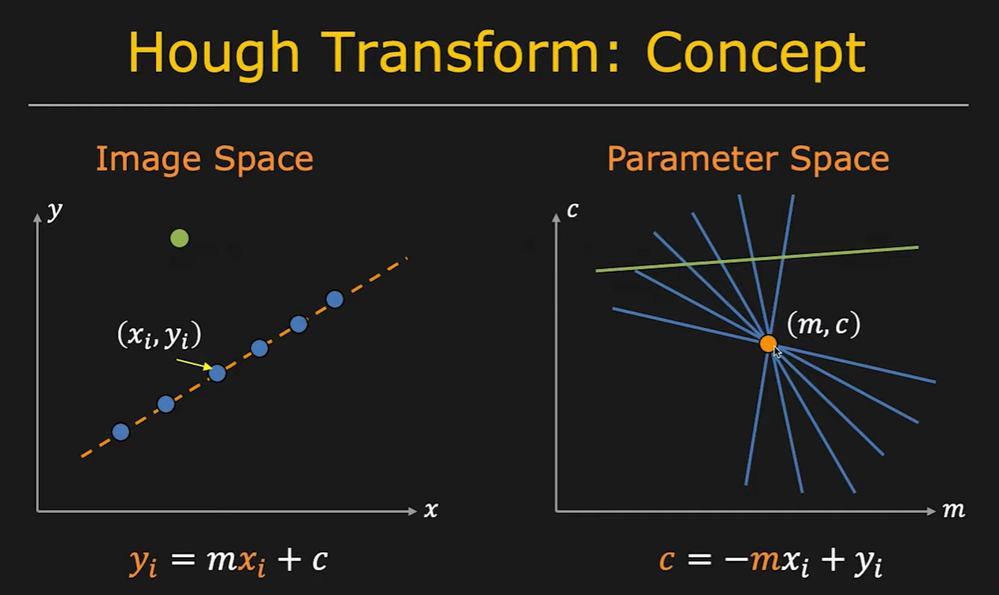
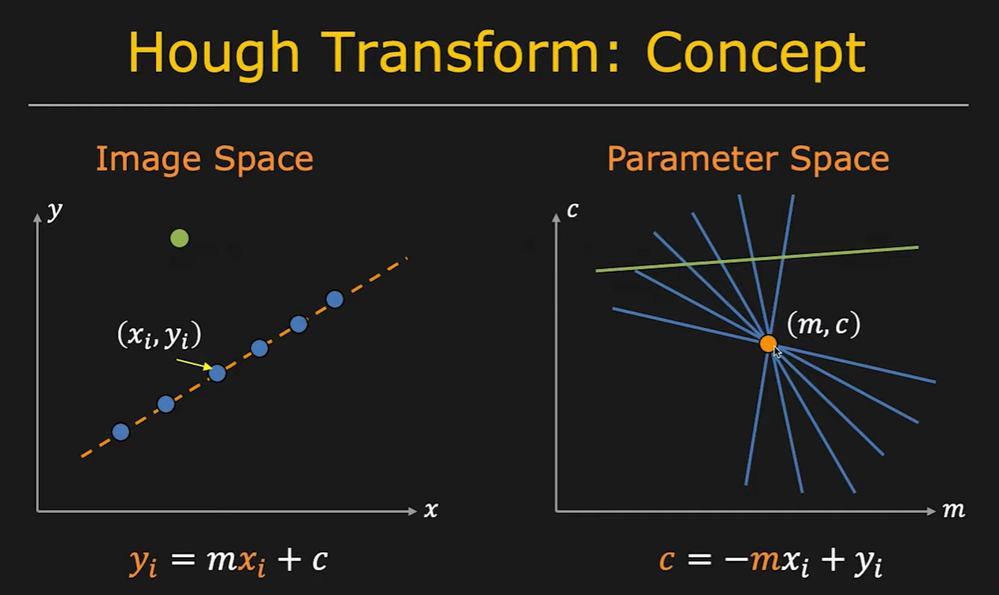
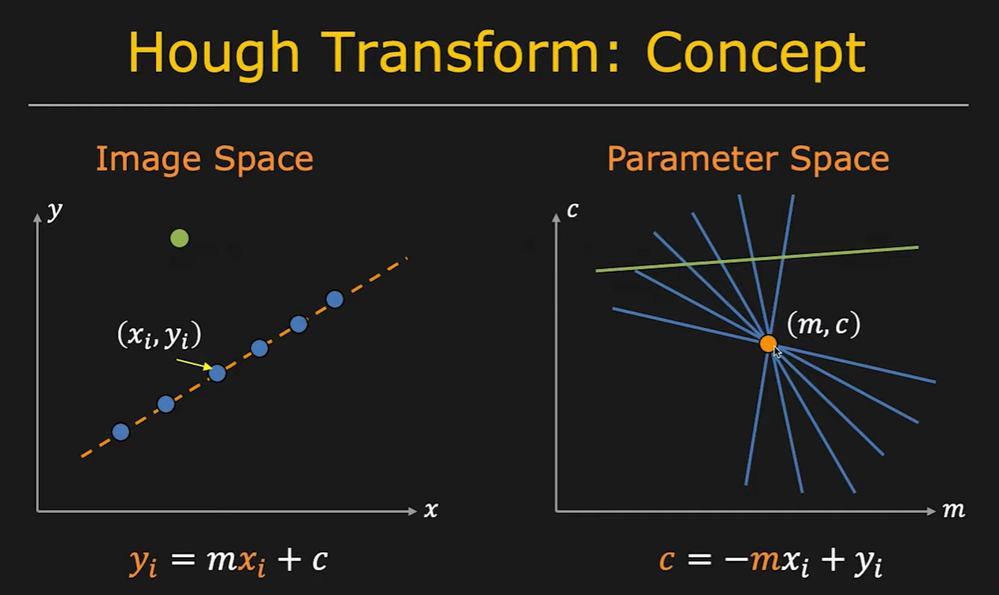

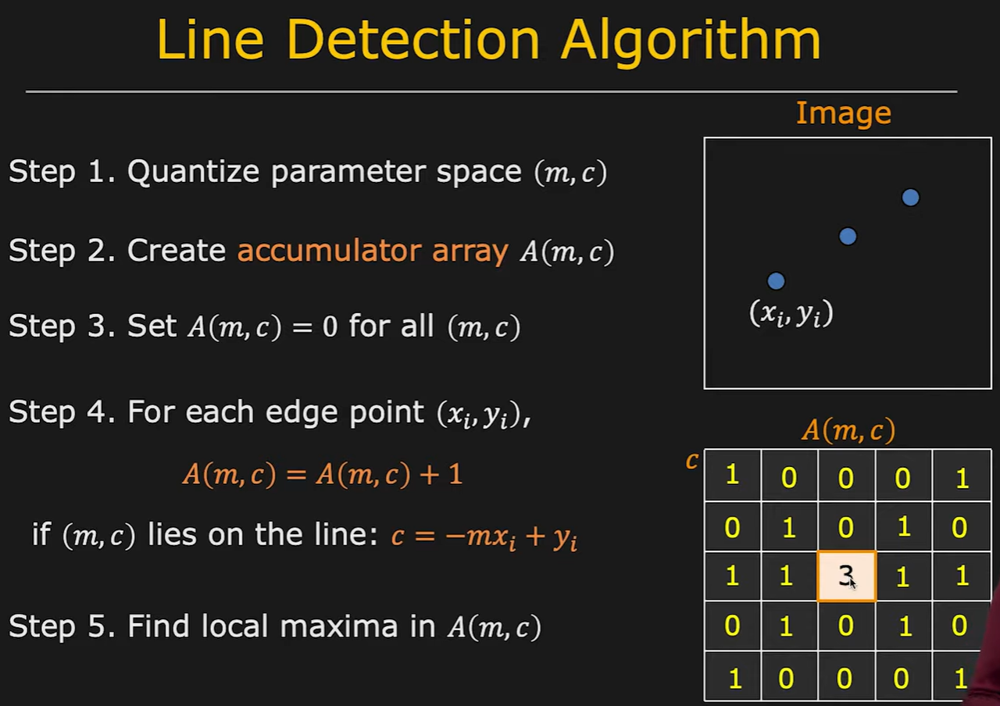

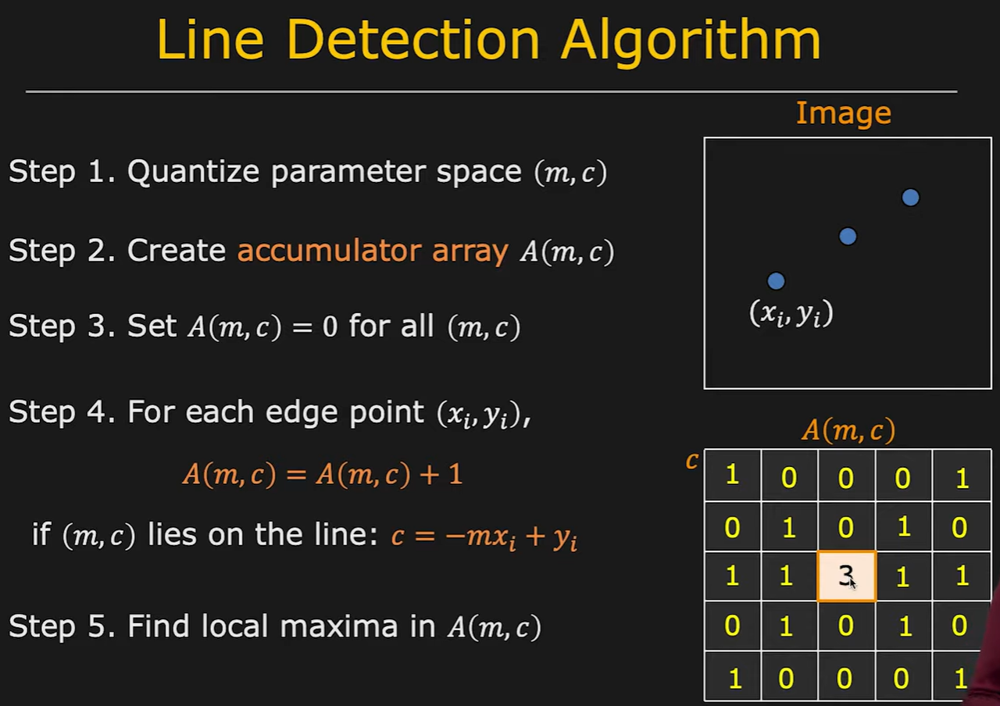
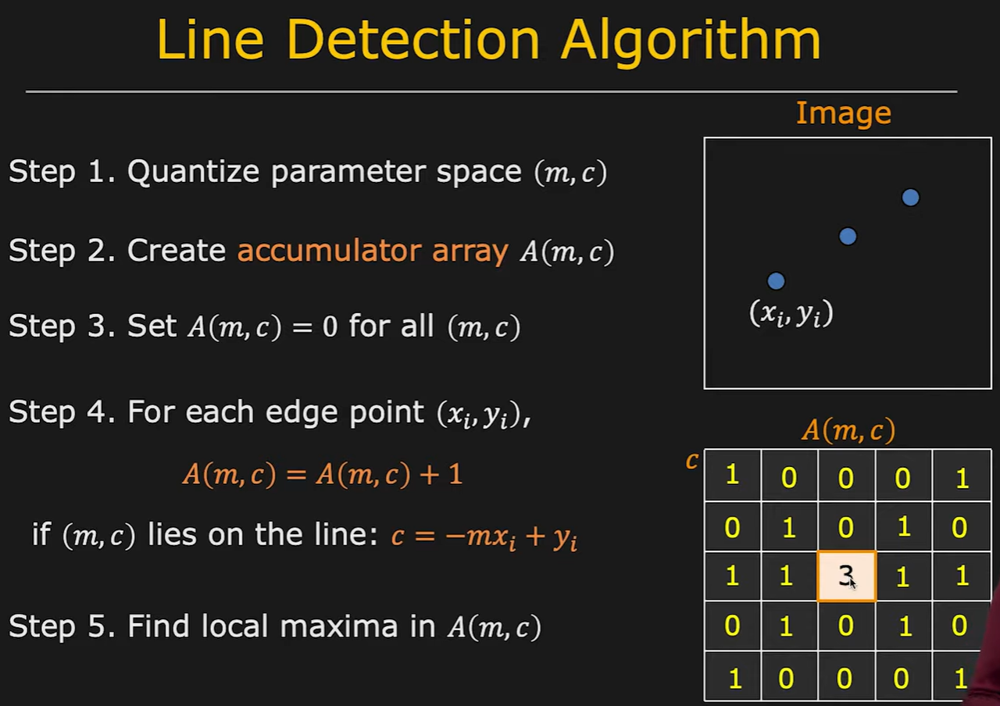

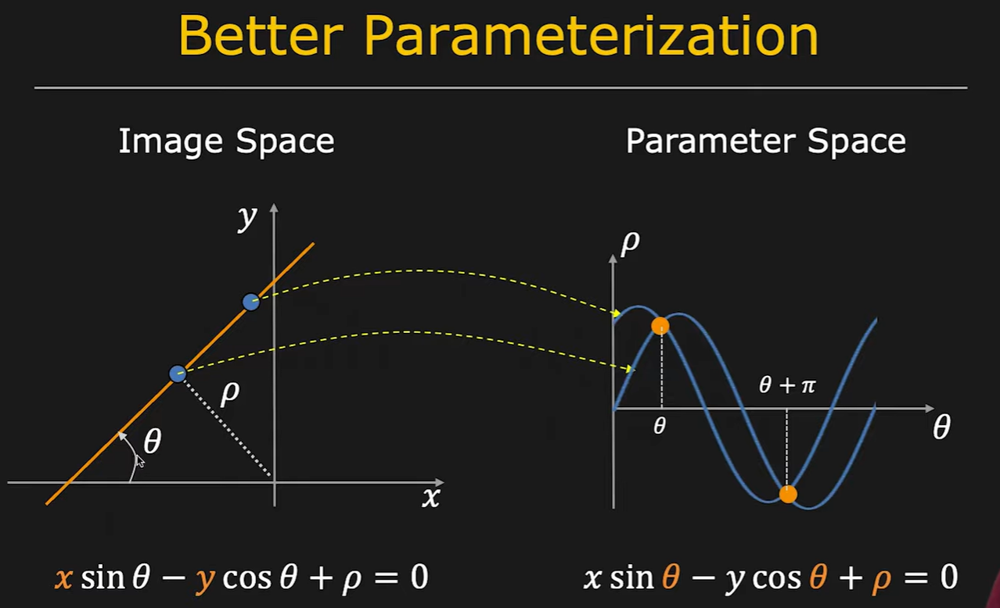


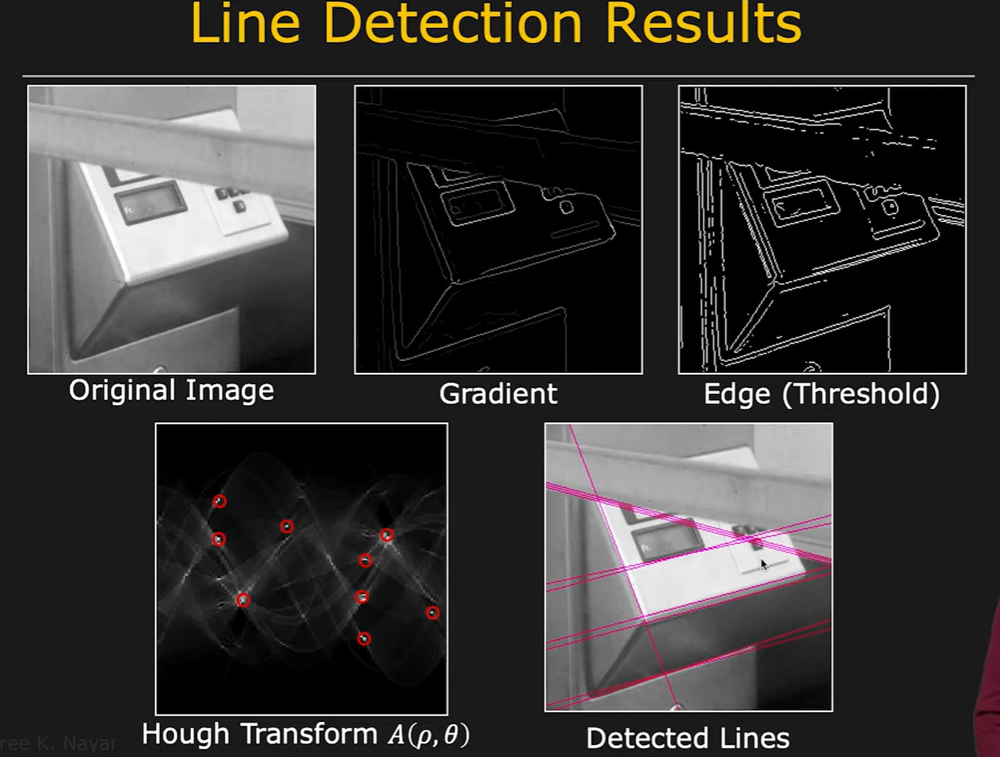

 $$ r = x cos{\Theta}  + y \sin{\Theta}$$

Алгоритм:

0. Фильтром Соболя находим "границы" + фильтруем по значению после фильтра Соболя.
1. Создаем матрицу аккумулятора ($\sqrt{W^2+H^2}$, 180)
2. Для каждой оставшейся точки, перебираем все $\Theta$ и вычисляем соответствующие $r$
3. Выбираем $n$ максимумов из аккумулятора (точки в этой матрице и есть наши прямые)
4. Оставляем (или выделяем) точки исходного изображения которые удовлетворяют этим $r,\Theta$

## 0. Фильтром Соболя находим "границы" + фильтруем по значению после фильтра Соболя.

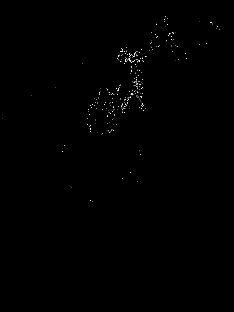

In [153]:

from matplotlib import pyplot as plt

T  = 50 # limit

edges = (G_my_Sobol_uint8 > T).astype(np.uint8)
show_image(edges * 255)
# plt.imshow(edges, cmap='gray', vmin=0, vmax=1)



## 1. Создаем матрицу аккумулятора ($\sqrt{W^2+H^2}$, 180)


In [154]:
H, W = edges.shape
diag = int((W**2 + H**2)**0.5)

accumulator = np.array( [[ 0  for _ in range(2 * diag + 1)] for _ in range(0, 180)] )
print(accumulator.shape)

(180, 10081)


## 2. Для каждой оставшейся точки, перебираем все $\Theta$ и вычисляем соответствующие $r$

In [155]:
thetas_rad = np.deg2rad(np.arange(0, 180))
cos_t = np.cos(thetas_rad)
sin_t = np.sin(thetas_rad)

votes_points = [ [ [] for _ in range(2*diag + 1) ] for _ in range(180) ]


for x in range(W-1):
    for y in range(H-1):
        if edges[y, x] == 1:
            for i in range(len(thetas_rad)):

                r = int(x * cos_t[i] + y * sin_t[i])
                r_idx = round(r + diag)
                accumulator[i, r_idx] += 1

                votes_points[i][r_idx].append((x, y))


## 3. Выбираем $n$ максимумов из аккумулятора (точки в этой матрице и есть наши прямые)


In [156]:
import numpy as np
#
def top_n_peaks(accumulator, N):
    flat = accumulator.ravel()
    top_idxs = np.argsort(flat)[-N:][::-1]
    peaks = [np.unravel_index(idx, accumulator.shape) + (flat[idx],) for idx in top_idxs]
    # peaks: list of (rho_idx, theta_idx, votes)  OR (theta_idx, rho_idx, votes) в зависимости от shape
    return peaks





In [157]:

N = 1550
peaks = top_n_peaks(accumulator, N=N)

In [158]:



min_length = 60
max_gap = 10
color = (0, 255, 0)
thickness = 2

orig = originalImage.copy()
img_out = orig.copy()
# img_out = np.zeros((H, W, 3 (сделана)), np.uint8)
num_thetas, num_rhos = accumulator.shape
thetas_rad = np.deg2rad(np.arange(0, 180))



$\rho_0 = (\rho \cos \theta ; \rho \sin \theta)$ - координаты точки которая ближе всего к началу координат

$n = (\cos\theta ; \sin\theta)$ - нормуль

$ d=(−sinθ,cosθ) $ - Направляющий (единичный) вектор

$ v_i = (x_i - \rho_0 ; y_i-\rho_0) $ - вектор от начала и до талого

$ t_i = v_i d$ - длина проекции вектора $ v_i $ на направление линии

$ p = p_0 + td $ - уравнение прямой в векторной форме

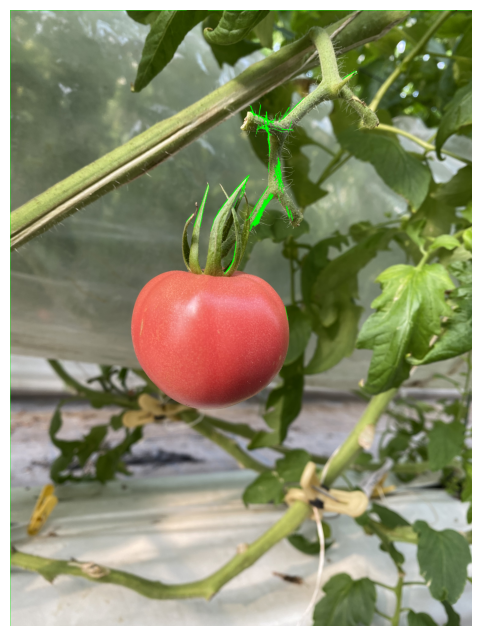

In [159]:

def segments_from_votes(points, theta_idx, rho_idx, diag, thetas_rad, W, H, min_length, max_gap):


    r_real = rho_idx - diag
    cos_t = math.cos(thetas_rad[theta_idx])
    sin_t = math.sin(thetas_rad[theta_idx])

    # направление линии
    dir_x = -sin_t
    dir_y = cos_t

    pts = np.array(points, dtype=float) # все точки, которые голосовали за эту линию
    p0x = r_real * cos_t
    p0y = r_real * sin_t

    direction = np.array([dir_x, dir_y])  # вектор вдоль линии
    p0 = np.array([p0x, p0y])

    vectors = pts - p0
    ts = np.dot(vectors, direction) # скалярное произведение с направлением линии (длина проекции этой точки вдоль линии)


    order = np.argsort(ts)
    ts_sorted = ts[order] #отсортировал
    pts_sorted = pts[order]

    if len(ts_sorted) < 2:
        return []

    # разбиваем на группы по разрывам вдоль линии
    gaps = np.diff(ts_sorted)
    split_idxs = np.where(gaps > max_gap)[0]
    boundaries = []
    start = 0
    for s in split_idxs:
        boundaries.append((start, s))
        start = s + 1
    boundaries.append((start, len(ts_sorted) - 1))

    segments = []
    for (s, e) in boundaries:
        if e <= s:
            continue
        t0, t1 = ts_sorted[s], ts_sorted[e]
        if abs(t1 - t0) < min_length:
            continue

        #  обратно в координаты изображения
        ax = int(round(p0x + t0 * dir_x))
        ay = int(round(p0y + t0 * dir_y))
        bx = int(round(p0x + t1 * dir_x))
        by = int(round(p0y + t1 * dir_y))

        # огранич границами картинки
        ax = np.clip(ax, 0, W-1)
        bx = np.clip(bx, 0, W-1)
        ay = np.clip(ay, 0, H-1)
        by = np.clip(by, 0, H-1)

        segments.append(((ax, ay), (bx, by)))

    return segments

# Основной цикл по пикам
for theta_idx, rho_idx, votes in peaks:
    theta_idx = int(theta_idx)
    rho_idx = int(rho_idx)
    if not (0 <= theta_idx < num_thetas and 0 <= rho_idx < num_rhos):
        continue

    pts = votes_points[theta_idx][rho_idx]
    segs = segments_from_votes(
        pts, theta_idx, rho_idx, diag, thetas_rad, W, H,
        min_length=min_length, max_gap=max_gap
    )

    # рисуем все найденные сегменты
    for (p1, p2) in segs:
        cv2.line(img_out, p1, p2, color, thickness)

plt.figure(figsize=(10, 8))
plt.axis('off')
plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
plt.show()

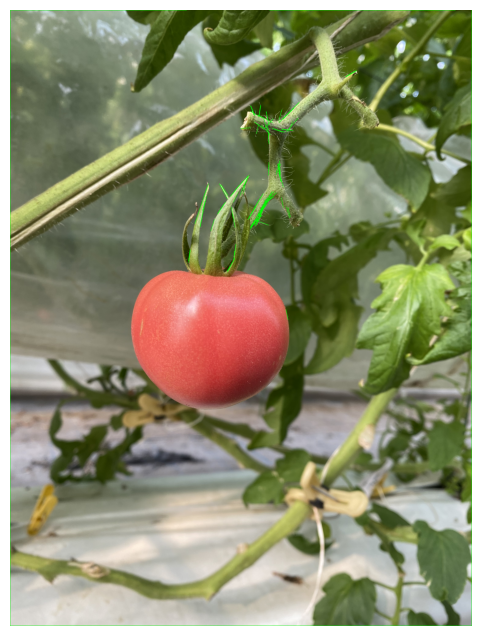

In [160]:
linesP = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=50, minLineLength=60, maxLineGap=10)

# img_houghP = np.zeros((H, W, 3 (сделана)), np.uint8)
img_houghP  = orig.copy()

if linesP is not None:
    for x1, y1, x2, y2 in linesP[:, 0]:
        cv2.line(img_houghP, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(10, 8))
plt.axis("off")
plt.imshow(cv2.cvtColor(img_houghP, cv2.COLOR_BGR2RGB))
plt.show()


волосы нашел. работает

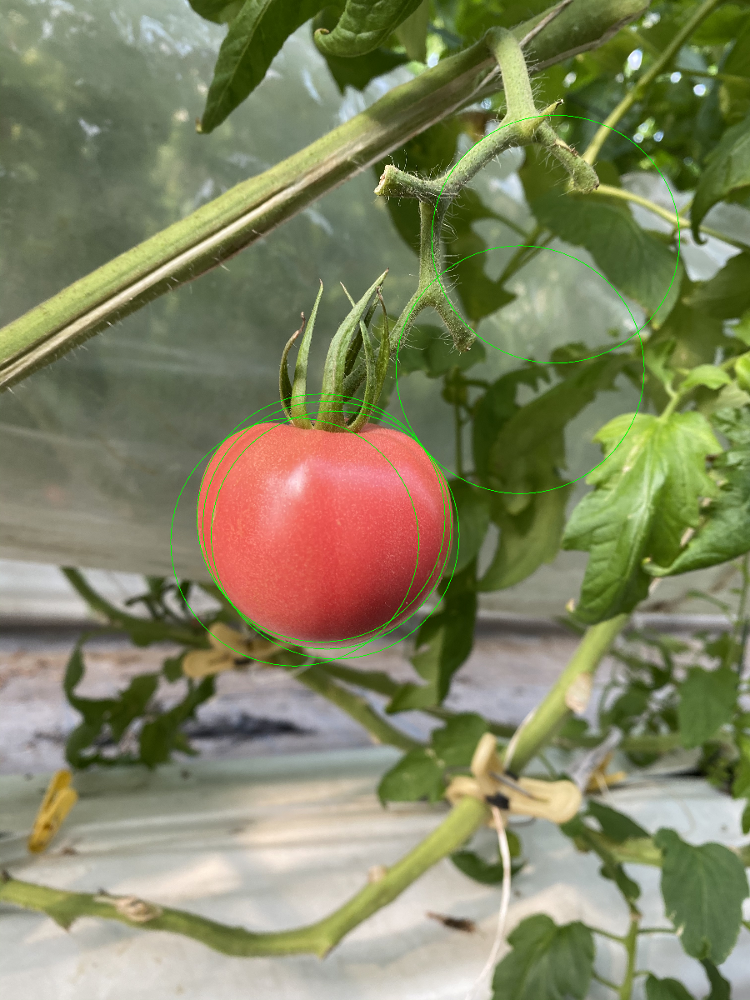

In [180]:
import cv2
import numpy as np

def hough_circles_fixed_radius(img, radius, blur_ksize=5, canny_thresh1=100, canny_thresh2=200,
                               acc_thresh=0.4, min_dist=20, max_circles=None, min_votes=None):
    if img.ndim == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img.copy()
    gray = cv2.GaussianBlur(gray, (blur_ksize | 1, blur_ksize | 1), 0)
    edges = cv2.Canny(gray, canny_thresh1, canny_thresh2)
    gx = cv2.Sobel(gray.astype(np.float32), cv2.CV_32F, 1, 0, ksize=3)
    gy = cv2.Sobel(gray.astype(np.float32), cv2.CV_32F, 0, 1, ksize=3)
    mag = np.sqrt(gx*gx + gy*gy) + 1e-9
    gx /= mag
    gy /= mag
    h, w = gray.shape
    accumulator = np.zeros((h, w), dtype=np.uint32)
    ys, xs = np.nonzero(edges)
    for y, x in zip(ys, xs):
        dx = gx[y, x] * radius
        dy = gy[y, x] * radius
        for sx, sy in ((x + dx, y + dy), (x - dx, y - dy)):
            cx = int(round(sx))
            cy = int(round(sy))
            if 0 <= cx < w and 0 <= cy < h:
                accumulator[cy, cx] += 1

    # опционально: сгладить аккумулятор, чтобы убрать шум перед поиском пиков
    accumulator_blur = cv2.GaussianBlur(accumulator.astype(np.float32), (5,5), 0)

    max_acc = int(accumulator_blur.max())
    if max_acc == 0:
        return []

    if min_votes is None:
        thresh_val = int(np.ceil(acc_thresh * max_acc))
    else:
        thresh_val = int(min_votes)

    candidates = np.column_stack(np.where(accumulator_blur >= thresh_val))
    votes = [int(accumulator_blur[y, x]) for y, x in candidates]
    cand_list = sorted([(int(x), int(y), v) for (y, x), v in zip(candidates, votes)],
                       key=lambda t: t[2], reverse=True)

    picked = []
    for cx, cy, v in cand_list:
        ok = True
        for px, py, _ in picked:
            if (cx - px) ** 2 + (cy - py) ** 2 < min_dist ** 2:
                ok = False
                break
        if ok:
            picked.append((cx, cy, v))
            if max_circles is not None and len(picked) >= max_circles:
                break

    return picked


img = originalImage.copy()
radius = 500
centers = hough_circles_fixed_radius(img, radius=radius)
for x, y, votes in centers:
    cv2.circle(img, (x, y), radius, (0,255,0), 2)
cv2.imwrite("detected.png", img)
show_image(img, max_size=1200)


In [181]:
import cv2
import numpy as np

def hough_circles_variable_radius(img, r_min, r_max, r_step=1,
                                  blur_ksize=5, canny_thresh1=100, canny_thresh2=200,
                                  acc_thresh=0.4, min_votes=None,
                                  min_dist=20, max_circles=None):
    if img.ndim == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img.copy()
    blur_ksize = blur_ksize | 1
    gray = cv2.GaussianBlur(gray, (blur_ksize, blur_ksize), 0)
    edges = cv2.Canny(gray, canny_thresh1, canny_thresh2)
    gx = cv2.Sobel(gray.astype(np.float32), cv2.CV_32F, 1, 0, ksize=3)
    gy = cv2.Sobel(gray.astype(np.float32), cv2.CV_32F, 0, 1, ksize=3)
    mag = np.sqrt(gx * gx + gy * gy) + 1e-9
    gx /= mag
    gy /= mag
    h, w = gray.shape
    ys, xs = np.nonzero(edges)
    if len(xs) == 0:
        return []
    candidates = []
    radii = list(range(r_min, r_max + 1, max(1, r_step)))
    for r in radii:
        accumulator = np.zeros((h, w), dtype=np.uint32)
        for y, x in zip(ys, xs):
            dx = gx[y, x] * r
            dy = gy[y, x] * r
            sx1 = int(round(x + dx))
            sy1 = int(round(y + dy))
            if 0 <= sx1 < w and 0 <= sy1 < h:
                accumulator[sy1, sx1] += 1
            sx2 = int(round(x - dx))
            sy2 = int(round(y - dy))
            if 0 <= sx2 < w and 0 <= sy2 < h:
                accumulator[sy2, sx2] += 1
        accumulator_blur = cv2.GaussianBlur(accumulator.astype(np.float32), (5,5), 0)
        max_acc = int(accumulator_blur.max())
        if max_acc == 0:
            continue
        if min_votes is None:
            thresh_val = int(np.ceil(acc_thresh * max_acc))
        else:
            thresh_val = int(min_votes)
        ys_c, xs_c = np.where(accumulator_blur >= thresh_val)
        for cy, cx in zip(ys_c, xs_c):
            votes = int(accumulator_blur[cy, cx])
            candidates.append((int(cx), int(cy), int(r), votes))
    if not candidates:
        return []
    candidates.sort(key=lambda t: t[3], reverse=True)
    picked = []
    for cx, cy, r, v in candidates:
        ok = True
        for px, py, pr, pv in picked:
            if (cx - px) ** 2 + (cy - py) ** 2 < min_dist ** 2:
                ok = False
                break
        if ok:
            picked.append((cx, cy, r, v))
            if max_circles is not None and len(picked) >= max_circles:
                break
    return picked


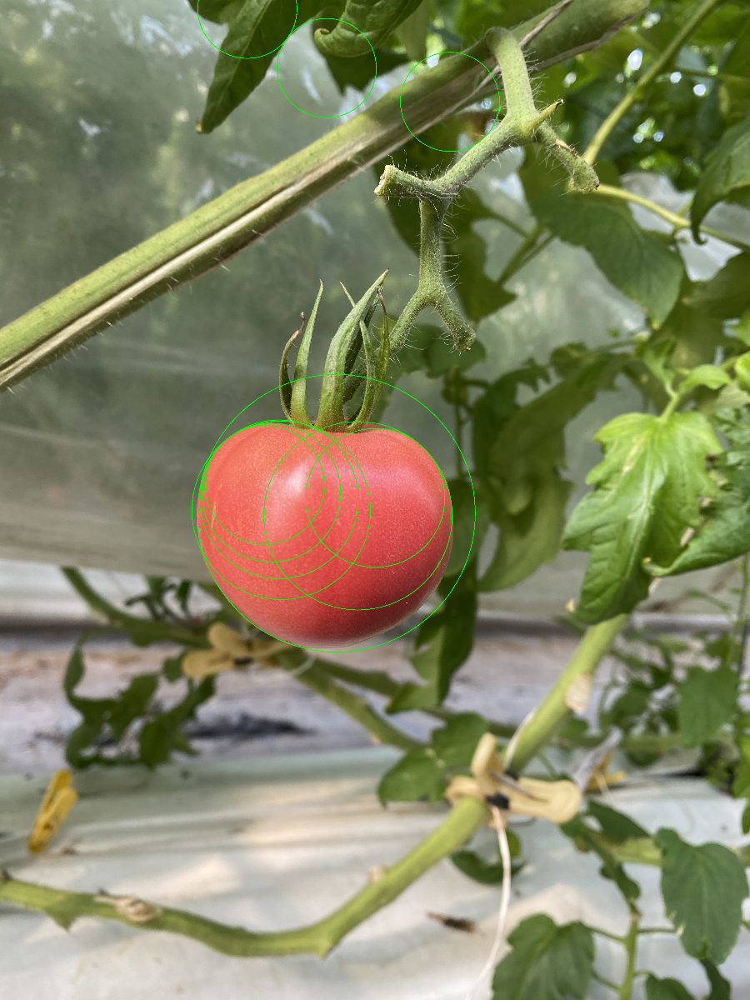

In [186]:
img = originalImage.copy()
results = hough_circles_variable_radius(img, r_min=200, r_max=560, r_step=20,
                                       blur_ksize=5, canny_thresh1=80, canny_thresh2=160,
                                       acc_thresh=0.45, min_dist=30, max_circles=10)
for x, y, r, votes in results:
    cv2.circle(img, (x, y), r, (0, 255, 0), 2)
show_image(img, max_size=1200)
